# 安徽安庆市项目`WRF-CMAQ`模拟分析
## `MEIC`清单插值到9km网格的排放源与`YRD~10km`清单对比

---
*@author: Evan*\
*@date: 2023-04-13*

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from matplotlib import rcParams
config = {
    "font.family":'Times New Roman',
    "mathtext.fontset":'stix',
    "font.serif": ['SimSun'],
}
rcParams.update(config)

import cartopy.crs as ccrs
import cartopy.feature as cfeat
from cartopy.io.shapereader import Reader

# silence the warning note
import warnings
warnings.filterwarnings("ignore")

## 读取数据

In [2]:
YRDpath = 'F:/Data/case_anqing/YRD2017/'
MEICpath = 'F:/Data/case_anqing/YRD2017/_MEIC_9km/'

# MEIC emission sources
names = ['agr', 'ind', 'pow', 'res', 'tra']
# YRD emission sources and species
NAMES = ['AGRICULTURE', 'INDUSTRY', 'POWER', 'RESIDENTIAL', 'TRANSPORTATION']
vars = ['NOx', 'CO', 'SO2', 'PM25', 'NH3',] # 'ISOP',

meicdata = {}
yrddata = {}

for name in names:
    meicdata[name] = xr.open_dataset(MEICpath + 'emis.CN9AH_112X106.{}.ncf'.format(name))
    
for NAME in NAMES:
    index = NAMES.index(NAME)
    yrddata[names[index]] = {}
    for var in vars:
        yrddata[names[index]][var] = xr.open_dataset(YRDpath + '{}/YRD_2017_{}_{}_0.1x0.1.nc'.format(NAME,NAME,var))

grid = xr.open_dataset('F:/Data/case_anqing/YRD2017/GRID_CN9/GRIDCRO2D_2023021.nc')

In [5]:
lat = grid.LAT.squeeze()
lon = grid.LON.squeeze()

In [7]:
shp_aq = Reader('F:/Data/case_anqing/shapefile/Anqing_district/anqing_district.shp')
shp_pro = Reader('F:/shapefile/shp_for_ArcGis/ChinaAdminDivisonSHP-master/2. Province/province.shp')
shp_city = Reader('F:/shapefile/shp_for_ArcGis/ChinaAdminDivisonSHP-master/3. City/city.shp')

In [17]:
def ax_shp(ax,proj,shp_pro,shp_city,shp_aq,extent,interval):
    ax.add_feature(cfeat.ShapelyFeature(shp_city.geometries(),proj,edgecolor='gray',facecolor='None'), linewidth=0.8)
    ax.add_feature(cfeat.ShapelyFeature(shp_pro.geometries(),proj,edgecolor='k',facecolor='None'), linewidth=1)
    ax.add_feature(cfeat.ShapelyFeature(shp_aq.geometries(),proj,edgecolor='k',facecolor='None'), linewidth=0.5)

    gl=ax.gridlines(
        xlocs=np.arange(-180, 180 + 1, interval), ylocs=np.arange(-90, 90 + 1, interval),
        draw_labels=True, x_inline=False, y_inline=False,
        linewidth=0, linestyle='--', color='gray')
    gl.top_labels = False
    gl.right_labels =False
    gl.rotate_labels=False

    ax.set_extent(extent,proj) # d03
    
    return ax


## 工业源`Industry`

In [137]:
sel = 'ind'

# NOx
# meic_NO2 = meicdata[sel].NO2.sum(dim='TSTEP').squeeze() # unit:10^6 moles/yr
meic_NO2 = meicdata[sel].NO2.sum(dim='TSTEP').squeeze()*47 # unit:Mg/yr
meic_NO = meicdata[sel].NO.sum(dim='TSTEP').squeeze()*31 # unit:Mg/yr
meic_NOx = meic_NO + meic_NO2
yrd_NOx = yrddata[sel]['NOx'].NOx_INDUSTRY # unit:Mg/yr

# CO
meic_CO = meicdata[sel].CO.sum(dim='TSTEP').squeeze()*30 # unit:Mg/yr
yrd_CO = yrddata[sel]['CO'].CO_INDUSTRY # unit:Mg/yr

# SO2
meic_SO2 = meicdata[sel].SO2.sum(dim='TSTEP').squeeze()*64 # unit:Mg/yr
yrd_SO2 = yrddata[sel]['SO2'].SO2_INDUSTRY # unit:Mg/yr

# NH3
meic_NH3 = meicdata[sel].NH3.sum(dim='TSTEP').squeeze()*18 # unit:Mg/yr
yrd_NH3 = yrddata[sel]['NH3'].NH3_INDUSTRY # unit:Mg/yr

yrdlat = yrd_NOx.lat
yrdlon = yrd_NOx.lon

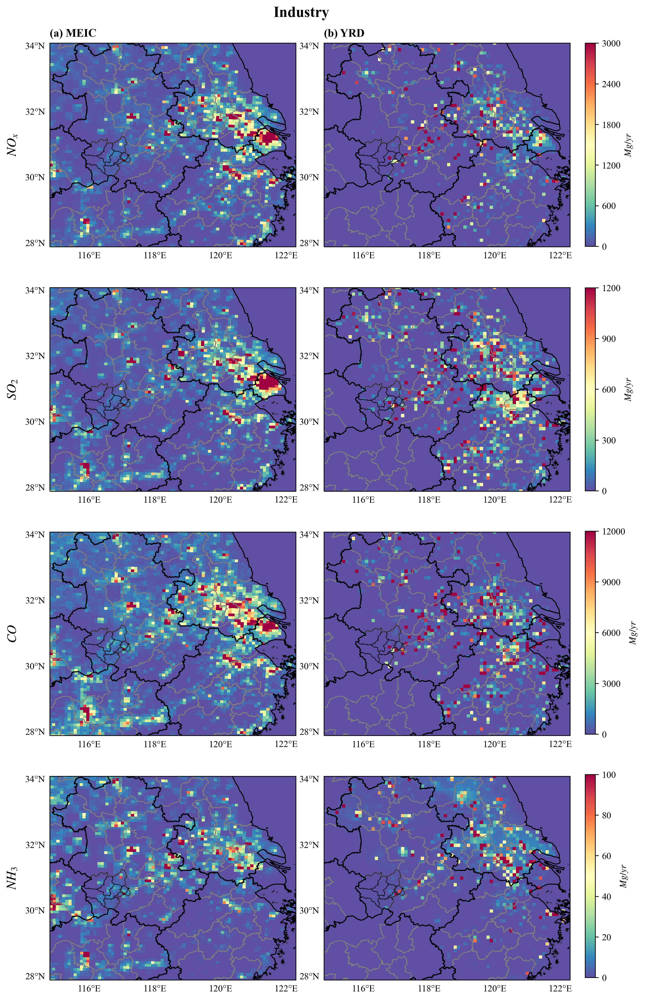

In [138]:
cmax = [3000, 1200, 12000, 100]
cblevel = [600, 300, 3000, 20]
proj=ccrs.PlateCarree()

fig = plt.figure(figsize=(10,18),dpi=300)
ax = fig.subplots(4,2,subplot_kw={'projection':proj})

extent = [114.8, 122.3, 27.9, 34.1]
interval = 2
for i in range(4):
    for j in range(2):
        ax_shp(ax[i][j],proj,shp_pro,shp_city,shp_aq,extent,interval)
        
cp1=ax[0][0].pcolormesh(lon,lat,meic_NOx,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[0])
ax[0][1].pcolormesh(yrdlon,yrdlat,yrd_NOx,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[0])
ax[0][0].text(x=-0.15,y=0.5,s='$NO_x$',transform=ax[0][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

cp2=ax[1][0].pcolormesh(lon,lat,meic_SO2,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[1])
ax[1][1].pcolormesh(yrdlon,yrdlat,yrd_SO2,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[1])
ax[1][0].text(x=-0.15,y=0.5,s='$SO_2$',transform=ax[1][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

cp3=ax[2][0].pcolormesh(lon,lat,meic_CO,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[2])
ax[2][1].pcolormesh(yrdlon,yrdlat,yrd_CO,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[2])
ax[2][0].text(x=-0.15,y=0.5,s='$CO$',transform=ax[2][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

cp4=ax[3][0].pcolormesh(lon,lat,meic_NH3,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[3])
ax[3][1].pcolormesh(yrdlon,yrdlat,yrd_NH3,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[3])
ax[3][0].text(x=-0.15,y=0.5,s='$NH_3$',transform=ax[3][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

# share colorbar
fig.subplots_adjust(right=0.9,wspace=0.1)
pos1 = fig.add_axes([0.92,0.713,0.015,0.167])
cbar1 = fig.colorbar(cp1,cax=pos1)
cbar1.set_ticks(np.arange(0,cmax[0]+1,cblevel[0]))
cbar1.set_label('$Mg/yr$')

pos2 = fig.add_axes([0.92,0.512,0.015,0.167])
cbar2 = fig.colorbar(cp2,cax=pos2)
cbar2.set_ticks(np.arange(0,cmax[1]+1,cblevel[1]))
cbar2.set_label('$Mg/yr$')

pos3 = fig.add_axes([0.92,0.312,0.015,0.167])
cbar3 = fig.colorbar(cp3,cax=pos3)
cbar3.set_ticks(np.arange(0,cmax[2]+1,cblevel[2]))
cbar3.set_label('$Mg/yr$')

pos4 = fig.add_axes([0.92,0.112,0.015,0.167])
cbar4 = fig.colorbar(cp4,cax=pos4)
cbar4.set_ticks(np.arange(0,cmax[3]+1,cblevel[3]))
cbar4.set_label('$Mg/yr$')

ax[0][0].set_title('(a) MEIC',loc='left',weight='bold')
ax[0][1].set_title('(b) YRD',loc='left',weight='bold')

plt.suptitle('Industry',y=0.91,fontsize=16,weight='bold')
plt.show()

## 发电源`Power`

In [139]:
sel = 'pow'

# NOx
# meic_NO2 = meicdata[sel].NO2.sum(dim='TSTEP').squeeze() # unit:10^6 moles/yr
meic_NO2 = meicdata[sel].NO2.sum(dim='TSTEP').squeeze()*47 # unit:Mg/yr
meic_NO = meicdata[sel].NO.sum(dim='TSTEP').squeeze()*31 # unit:Mg/yr
meic_NOx = meic_NO + meic_NO2
yrd_NOx = yrddata[sel]['NOx'].NOx_POWER # unit:Mg/yr

# CO
meic_CO = meicdata[sel].CO.sum(dim='TSTEP').squeeze()*30 # unit:Mg/yr
yrd_CO = yrddata[sel]['CO'].CO_POWER # unit:Mg/yr

# SO2
meic_SO2 = meicdata[sel].SO2.sum(dim='TSTEP').squeeze()*64 # unit:Mg/yr
yrd_SO2 = yrddata[sel]['SO2'].SO2_POWER # unit:Mg/yr

# NH3
meic_NH3 = meicdata[sel].NH3.sum(dim='TSTEP').squeeze()*18 # unit:Mg/yr
yrd_NH3 = yrddata[sel]['NH3'].NH3_POWER # unit:Mg/yr

yrdlat = yrd_NOx.lat
yrdlon = yrd_NOx.lon

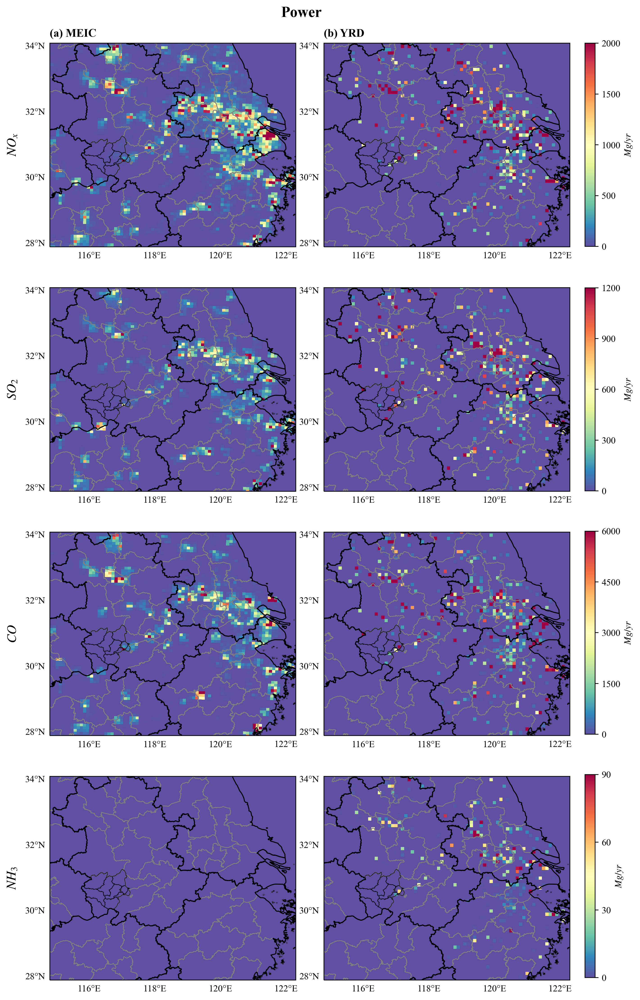

In [141]:
cmax=[2000, 1200, 6000, 90]
cblevel = [500, 300, 1500, 30]
proj=ccrs.PlateCarree()

fig = plt.figure(figsize=(10,18),dpi=300)
ax = fig.subplots(4,2,subplot_kw={'projection':proj})

extent = [114.8, 122.3, 27.9, 34.1]
interval = 2
for i in range(4):
    for j in range(2):
        ax_shp(ax[i][j],proj,shp_pro,shp_city,shp_aq,extent,interval)
        
cp1=ax[0][0].pcolormesh(lon,lat,meic_NOx,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[0])
ax[0][1].pcolormesh(yrdlon,yrdlat,yrd_NOx,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[0])
ax[0][0].text(x=-0.15,y=0.5,s='$NO_x$',transform=ax[0][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

cp2=ax[1][0].pcolormesh(lon,lat,meic_SO2,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[1])
ax[1][1].pcolormesh(yrdlon,yrdlat,yrd_SO2,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[1])
ax[1][0].text(x=-0.15,y=0.5,s='$SO_2$',transform=ax[1][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

cp3=ax[2][0].pcolormesh(lon,lat,meic_CO,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[2])
ax[2][1].pcolormesh(yrdlon,yrdlat,yrd_CO,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[2])
ax[2][0].text(x=-0.15,y=0.5,s='$CO$',transform=ax[2][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

cp4=ax[3][0].pcolormesh(lon,lat,meic_NH3,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[3])
ax[3][1].pcolormesh(yrdlon,yrdlat,yrd_NH3,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[3])
ax[3][0].text(x=-0.15,y=0.5,s='$NH_3$',transform=ax[3][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

# share colorbar
fig.subplots_adjust(right=0.9,wspace=0.1)
pos1 = fig.add_axes([0.92,0.713,0.015,0.167])
cbar1 = fig.colorbar(cp1,cax=pos1)
cbar1.set_ticks(np.arange(0,cmax[0]+1,cblevel[0]))
cbar1.set_label('$Mg/yr$')

pos2 = fig.add_axes([0.92,0.512,0.015,0.167])
cbar2 = fig.colorbar(cp2,cax=pos2)
cbar2.set_ticks(np.arange(0,cmax[1]+1,cblevel[1]))
cbar2.set_label('$Mg/yr$')

pos3 = fig.add_axes([0.92,0.312,0.015,0.167])
cbar3 = fig.colorbar(cp3,cax=pos3)
cbar3.set_ticks(np.arange(0,cmax[2]+1,cblevel[2]))
cbar3.set_label('$Mg/yr$')

pos4 = fig.add_axes([0.92,0.112,0.015,0.167])
cbar4 = fig.colorbar(cp4,cax=pos4)
cbar4.set_ticks(np.arange(0,cmax[3]+1,cblevel[3]))
cbar4.set_label('$Mg/yr$')

ax[0][0].set_title('(a) MEIC',loc='left',weight='bold')
ax[0][1].set_title('(b) YRD',loc='left',weight='bold')

plt.suptitle('Power',y=0.91,fontsize=16,weight='bold')
plt.show()

## 居民源`Residential`

In [128]:
sel = 'res'

# NOx
# meic_NO2 = meicdata[sel].NO2.sum(dim='TSTEP').squeeze() # unit:10^6 moles/yr
meic_NO2 = meicdata[sel].NO2.sum(dim='TSTEP').squeeze()*47 # unit:Mg/yr
meic_NO = meicdata[sel].NO.sum(dim='TSTEP').squeeze()*31 # unit:Mg/yr
meic_NOx = meic_NO + meic_NO2
yrd_NOx = yrddata[sel]['NOx'].NOx_RESIDENTIAL # unit:Mg/yr

# CO
meic_CO = meicdata[sel].CO.sum(dim='TSTEP').squeeze()*30 # unit:Mg/yr
yrd_CO = yrddata[sel]['CO'].CO_RESIDENTIAL # unit:Mg/yr

# SO2
meic_SO2 = meicdata[sel].SO2.sum(dim='TSTEP').squeeze()*64 # unit:Mg/yr
yrd_SO2 = yrddata[sel]['SO2'].SO2_RESIDENTIAL # unit:Mg/yr

# NH3
meic_NH3 = meicdata[sel].NH3.sum(dim='TSTEP').squeeze()*18 # unit:Mg/yr
yrd_NH3 = yrddata[sel]['NH3'].NH3_RESIDENTIAL # unit:Mg/yr

yrdlat = yrd_NOx.lat
yrdlon = yrd_NOx.lon

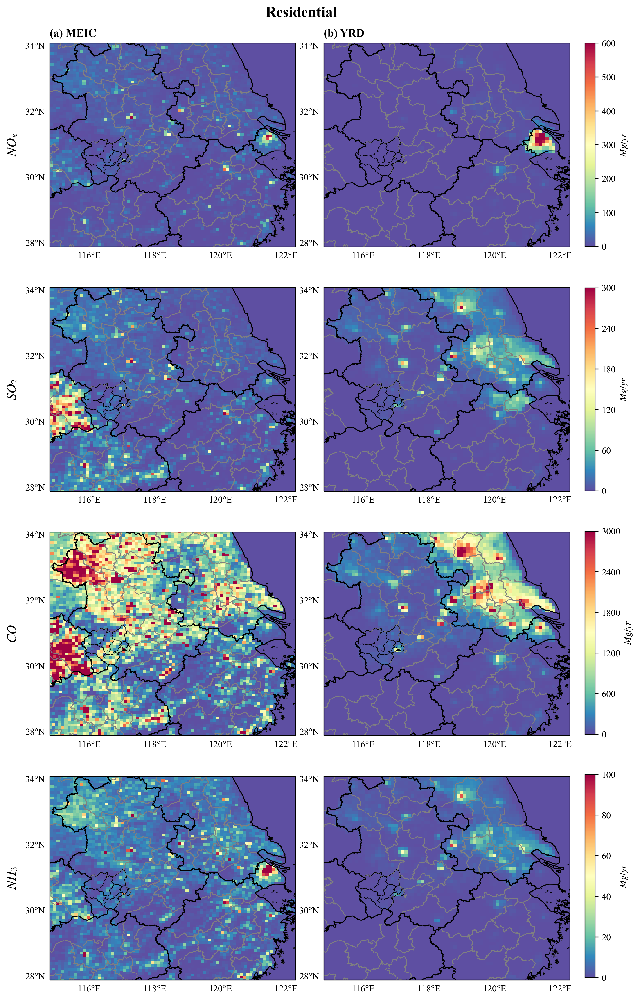

In [129]:
cmax=[600, 300, 3000, 100]
proj=ccrs.PlateCarree()

fig = plt.figure(figsize=(10,18),dpi=300)
ax = fig.subplots(4,2,subplot_kw={'projection':proj})

extent = [114.8, 122.3, 27.9, 34.1]
interval = 2
for i in range(4):
    for j in range(2):
        ax_shp(ax[i][j],proj,shp_pro,shp_city,shp_aq,extent,interval)
        
cp1=ax[0][0].pcolormesh(lon,lat,meic_NOx,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[0])
ax[0][1].pcolormesh(yrdlon,yrdlat,yrd_NOx,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[0])
ax[0][0].text(x=-0.15,y=0.5,s='$NO_x$',transform=ax[0][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

cp2=ax[1][0].pcolormesh(lon,lat,meic_SO2,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[1])
ax[1][1].pcolormesh(yrdlon,yrdlat,yrd_SO2,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[1])
ax[1][0].text(x=-0.15,y=0.5,s='$SO_2$',transform=ax[1][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

cp3=ax[2][0].pcolormesh(lon,lat,meic_CO,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[2])
ax[2][1].pcolormesh(yrdlon,yrdlat,yrd_CO,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[2])
ax[2][0].text(x=-0.15,y=0.5,s='$CO$',transform=ax[2][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

cp4=ax[3][0].pcolormesh(lon,lat,meic_NH3,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[3])
ax[3][1].pcolormesh(yrdlon,yrdlat,yrd_NH3,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[3])
ax[3][0].text(x=-0.15,y=0.5,s='$NH_3$',transform=ax[3][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

# share colorbar
fig.subplots_adjust(right=0.9,wspace=0.1)
pos1 = fig.add_axes([0.92,0.713,0.015,0.167])
cbar1 = fig.colorbar(cp1,cax=pos1)
cbar1.set_ticks(np.arange(0,cmax[0]+1,100))
cbar1.set_label('$Mg/yr$')

pos2 = fig.add_axes([0.92,0.512,0.015,0.167])
cbar2 = fig.colorbar(cp2,cax=pos2)
cbar2.set_ticks(np.arange(0,cmax[1]+1,60))
cbar2.set_label('$Mg/yr$')

pos3 = fig.add_axes([0.92,0.312,0.015,0.167])
cbar3 = fig.colorbar(cp3,cax=pos3)
cbar3.set_ticks(np.arange(0,cmax[2]+1,600))
cbar3.set_label('$Mg/yr$')

pos4 = fig.add_axes([0.92,0.112,0.015,0.167])
cbar4 = fig.colorbar(cp4,cax=pos4)
cbar4.set_ticks(np.arange(0,cmax[3]+1,20))
cbar4.set_label('$Mg/yr$')

ax[0][0].set_title('(a) MEIC',loc='left',weight='bold')
ax[0][1].set_title('(b) YRD',loc='left',weight='bold')

plt.suptitle('Residential',y=0.91,fontsize=16,weight='bold')
plt.show()

## 交通源`Transportation`

In [130]:
sel = 'tra'

# NOx
# meic_NO2 = meicdata[sel].NO2.sum(dim='TSTEP').squeeze() # unit:10^6 moles/yr
meic_NO2 = meicdata[sel].NO2.sum(dim='TSTEP').squeeze()*47 # unit:Mg/yr
meic_NO = meicdata[sel].NO.sum(dim='TSTEP').squeeze()*31 # unit:Mg/yr
meic_NOx = meic_NO + meic_NO2
yrd_NOx = yrddata[sel]['NOx'].NOx_TRANSPORTATION # unit:Mg/yr

# CO
meic_CO = meicdata[sel].CO.sum(dim='TSTEP').squeeze()*30 # unit:Mg/yr
yrd_CO = yrddata[sel]['CO'].CO_TRANSPORTATION # unit:Mg/yr

# SO2
meic_SO2 = meicdata[sel].SO2.sum(dim='TSTEP').squeeze()*64 # unit:Mg/yr
yrd_SO2 = yrddata[sel]['SO2'].SO2_TRANSPORTATION # unit:Mg/yr

# NH3
meic_NH3 = meicdata[sel].NH3.sum(dim='TSTEP').squeeze()*18 # unit:Mg/yr
yrd_NH3 = yrddata[sel]['NH3'].NH3_TRANSPORTATION # unit:Mg/yr

yrdlat = yrd_NOx.lat
yrdlon = yrd_NOx.lon

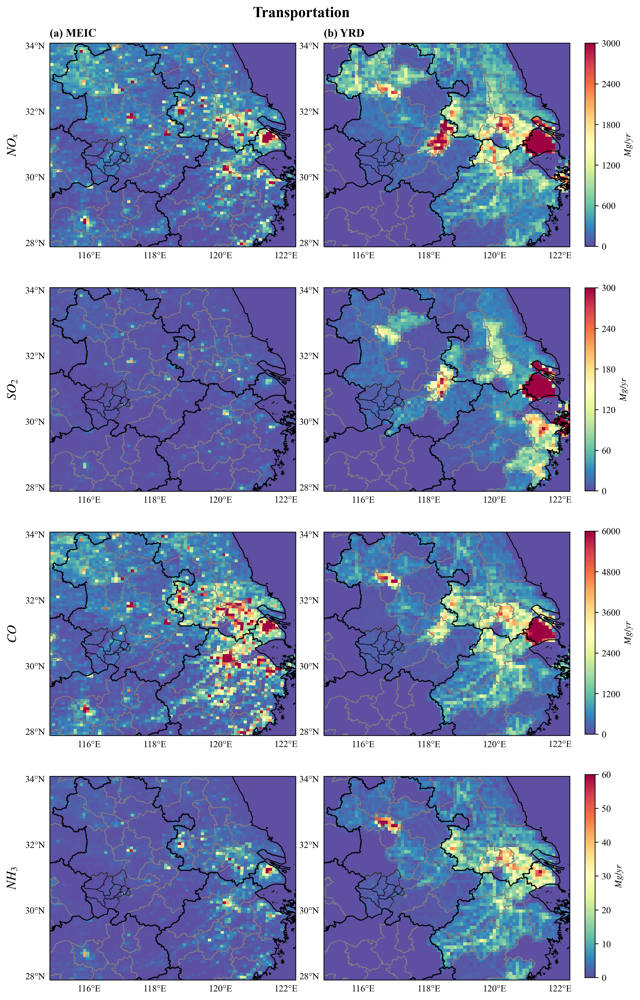

In [132]:
cmax=[3000, 300, 6000, 60]
cblevel=[600, 60, 1200, 10]
proj=ccrs.PlateCarree()

fig = plt.figure(figsize=(10,18),dpi=300)
ax = fig.subplots(4,2,subplot_kw={'projection':proj})

extent = [114.8, 122.3, 27.9, 34.1]
interval = 2
for i in range(4):
    for j in range(2):
        ax_shp(ax[i][j],proj,shp_pro,shp_city,shp_aq,extent,interval)
        
cp1=ax[0][0].pcolormesh(lon,lat,meic_NOx,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[0])
ax[0][1].pcolormesh(yrdlon,yrdlat,yrd_NOx,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[0])
ax[0][0].text(x=-0.15,y=0.5,s='$NO_x$',transform=ax[0][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

cp2=ax[1][0].pcolormesh(lon,lat,meic_SO2,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[1])
ax[1][1].pcolormesh(yrdlon,yrdlat,yrd_SO2,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[1])
ax[1][0].text(x=-0.15,y=0.5,s='$SO_2$',transform=ax[1][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

cp3=ax[2][0].pcolormesh(lon,lat,meic_CO,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[2])
ax[2][1].pcolormesh(yrdlon,yrdlat,yrd_CO,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[2])
ax[2][0].text(x=-0.15,y=0.5,s='$CO$',transform=ax[2][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

cp4=ax[3][0].pcolormesh(lon,lat,meic_NH3,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[3])
ax[3][1].pcolormesh(yrdlon,yrdlat,yrd_NH3,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[3])
ax[3][0].text(x=-0.15,y=0.5,s='$NH_3$',transform=ax[3][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

# share colorbar
fig.subplots_adjust(right=0.9,wspace=0.1)
pos1 = fig.add_axes([0.92,0.713,0.015,0.167])
cbar1 = fig.colorbar(cp1,cax=pos1)
cbar1.set_ticks(np.arange(0,cmax[0]+1,cblevel[0]))
cbar1.set_label('$Mg/yr$')

pos2 = fig.add_axes([0.92,0.512,0.015,0.167])
cbar2 = fig.colorbar(cp2,cax=pos2)
cbar2.set_ticks(np.arange(0,cmax[1]+1,cblevel[1]))
cbar2.set_label('$Mg/yr$')

pos3 = fig.add_axes([0.92,0.312,0.015,0.167])
cbar3 = fig.colorbar(cp3,cax=pos3)
cbar3.set_ticks(np.arange(0,cmax[2]+1,cblevel[2]))
cbar3.set_label('$Mg/yr$')

pos4 = fig.add_axes([0.92,0.112,0.015,0.167])
cbar4 = fig.colorbar(cp4,cax=pos4)
cbar4.set_ticks(np.arange(0,cmax[3]+1,cblevel[3]))
cbar4.set_label('$Mg/yr$')

ax[0][0].set_title('(a) MEIC',loc='left',weight='bold')
ax[0][1].set_title('(b) YRD',loc='left',weight='bold')

plt.suptitle('Transportation',y=0.91,fontsize=16,weight='bold')
plt.show()

## 农业源`Agriculture`

In [133]:
sel = 'agr'

# NOx
# meic_NO2 = meicdata[sel].NO2.sum(dim='TSTEP').squeeze() # unit:10^6 moles/yr
meic_NO2 = meicdata[sel].NO2.sum(dim='TSTEP').squeeze()*47 # unit:Mg/yr
meic_NO = meicdata[sel].NO.sum(dim='TSTEP').squeeze()*31 # unit:Mg/yr
meic_NOx = meic_NO + meic_NO2
yrd_NOx = yrddata[sel]['NOx'].NOx_AGRICULTURE # unit:Mg/yr

# CO
meic_CO = meicdata[sel].CO.sum(dim='TSTEP').squeeze()*30 # unit:Mg/yr
yrd_CO = yrddata[sel]['CO'].CO_AGRICULTURE # unit:Mg/yr

# SO2
meic_SO2 = meicdata[sel].SO2.sum(dim='TSTEP').squeeze()*64 # unit:Mg/yr
yrd_SO2 = yrddata[sel]['SO2'].SO2_AGRICULTURE # unit:Mg/yr

# NH3
meic_NH3 = meicdata[sel].NH3.sum(dim='TSTEP').squeeze()*18 # unit:Mg/yr
yrd_NH3 = yrddata[sel]['NH3'].NH3_AGRICULTURE # unit:Mg/yr

yrdlat = yrd_NOx.lat
yrdlon = yrd_NOx.lon

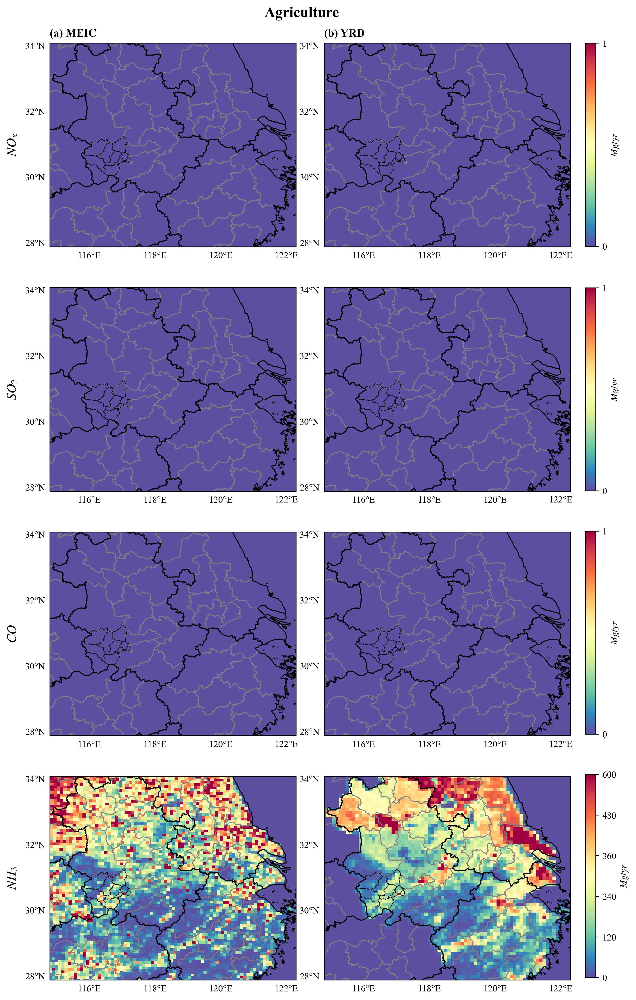

In [136]:
cmax=[1, 1, 1, 600]
cblevel=[1, 1, 1, 120]
proj=ccrs.PlateCarree()

fig = plt.figure(figsize=(10,18),dpi=300)
ax = fig.subplots(4,2,subplot_kw={'projection':proj})

extent = [114.8, 122.3, 27.9, 34.1]
interval = 2
for i in range(4):
    for j in range(2):
        ax_shp(ax[i][j],proj,shp_pro,shp_city,shp_aq,extent,interval)
        
cp1=ax[0][0].pcolormesh(lon,lat,meic_NOx,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[0])
ax[0][1].pcolormesh(yrdlon,yrdlat,yrd_NOx,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[0])
ax[0][0].text(x=-0.15,y=0.5,s='$NO_x$',transform=ax[0][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

cp2=ax[1][0].pcolormesh(lon,lat,meic_SO2,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[1])
ax[1][1].pcolormesh(yrdlon,yrdlat,yrd_SO2,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[1])
ax[1][0].text(x=-0.15,y=0.5,s='$SO_2$',transform=ax[1][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

cp3=ax[2][0].pcolormesh(lon,lat,meic_CO,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[2])
ax[2][1].pcolormesh(yrdlon,yrdlat,yrd_CO,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[2])
ax[2][0].text(x=-0.15,y=0.5,s='$CO$',transform=ax[2][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

cp4=ax[3][0].pcolormesh(lon,lat,meic_NH3,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[3])
ax[3][1].pcolormesh(yrdlon,yrdlat,yrd_NH3,transform=proj,cmap='Spectral_r',vmin=0,vmax=cmax[3])
ax[3][0].text(x=-0.15,y=0.5,s='$NH_3$',transform=ax[3][0].transAxes,rotation=90,ha='center',va='center',fontsize=14)

# share colorbar
fig.subplots_adjust(right=0.9,wspace=0.1)
pos1 = fig.add_axes([0.92,0.713,0.015,0.167])
cbar1 = fig.colorbar(cp1,cax=pos1)
cbar1.set_ticks(np.arange(0,cmax[0]+1,cblevel[0]))
cbar1.set_label('$Mg/yr$')

pos2 = fig.add_axes([0.92,0.512,0.015,0.167])
cbar2 = fig.colorbar(cp2,cax=pos2)
cbar2.set_ticks(np.arange(0,cmax[1]+1,cblevel[1]))
cbar2.set_label('$Mg/yr$')

pos3 = fig.add_axes([0.92,0.312,0.015,0.167])
cbar3 = fig.colorbar(cp3,cax=pos3)
cbar3.set_ticks(np.arange(0,cmax[2]+1,cblevel[2]))
cbar3.set_label('$Mg/yr$')

pos4 = fig.add_axes([0.92,0.112,0.015,0.167])
cbar4 = fig.colorbar(cp4,cax=pos4)
cbar4.set_ticks(np.arange(0,cmax[3]+1,cblevel[3]))
cbar4.set_label('$Mg/yr$')

ax[0][0].set_title('(a) MEIC',loc='left',weight='bold')
ax[0][1].set_title('(b) YRD',loc='left',weight='bold')

plt.suptitle('Agriculture',y=0.91,fontsize=16,weight='bold')
plt.show()